# **1. Veri Yükleme**

**1.1 Kütüphanelerin İçe Aktarılması**

- Veri işleme için pandas, sayısal işlemler için numpy, görselleştirme için matplotlib ve seaborn kütüphanelerini içe aktarın.
- Ayrıca os modülünü kullanarak dosya yolunu belirtin.

In [ ]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
%matplotlib inline
import cv2
import os
import seaborn as sns
from scipy.ndimage import zoom
sns.set()

**1.2 Veri Setinin Yüklenmesi:**
- train_df olarak adlandırılan veri çerçevesine CSV dosyasını yükleyin ve ilk birkaç satırı inceleyin.
- Toplam satır ve sütun sayısını ekrana yazdırın.

In [ ]:
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/
%ls nih/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 21.88 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis
densenet.hdf5  images_small/  pretrained_model.h5  test.csv  train-small.csv  valid-small.csv


In [ ]:
# Read csv file containing training datadata
train_df = pd.read_csv("nih/train-small.csv")
# Print first 5 rows
print(f'There are {train_df.shape[0]} rows and {train_df.shape[1]} columns in this data frame')
train_df.head()

There are 1000 rows and 16 columns in this data frame


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0


**1.3. Veri Özelliklerinin İncelenmesi**
- Sütunlardaki veri türlerini ve eksik değerleri inceleyin.
- PatientId sütunundaki benzersiz hasta sayısını analiz edin ve her bir hastanın birden fazla görüntüsü olup olmadığını belirleyin.

In [ ]:
# 1.3. Madde :
# dataframe icindeki null larin toplamı. Eger null datalar yogun ise calismamizi bozacaktir.
print(f"Null deger sayısı : {train_df.isnull().sum()}")
#print(f"Null deger sayısı : {train_df.isnull()}, DataType : {train_df.dtypes}")

# Data type in kontrol edilmesi. null value kontrolunun yapılması
train_df.info()

Null deger sayısı : Image                 0
Atelectasis           0
Cardiomegaly          0
Consolidation         0
Edema                 0
Effusion              0
Emphysema             0
Fibrosis              0
Hernia                0
Infiltration          0
Mass                  0
Nodule                0
PatientId             0
Pleural_Thickening    0
Pneumonia             0
Pneumothorax          0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int6

In [ ]:
print(f"Toplam Hasta Sayısı {train_df['PatientId'].count()}, unique id sayisi {train_df['PatientId'].value_counts().shape[0]} ")

Toplam Hasta Sayısı 1000, unique id sayisi 928 


# **2. Görüntü Yükleme ve Görselleştirme**

**1. Rastgele Görüntüler Seçme**
- train_df içindeki "Image" sütunundan rastgele 9 görüntü seçin.
- Bu görüntüleri yan yana görselleştirerek veri setindeki örnek görüntüleri inceleyin.

In [ ]:
# Datanin kontrol edilmesi ve gereksiz columnlarin silinmesi.
columns = train_df.keys()
columns = list(columns)
print(columns)
columns.remove('Image')
columns.remove('PatientId')
# Get the total classes
print(f"There are {len(columns)} columns of labels for these conditions: {columns}\n")

for column in columns:
    print(f"The class {column} has {train_df[column].sum()} samples")

['Image', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'PatientId', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']
There are 14 columns of labels for these conditions: ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']

The class Atelectasis has 106 samples
The class Cardiomegaly has 20 samples
The class Consolidation has 33 samples
The class Edema has 16 samples
The class Effusion has 128 samples
The class Emphysema has 13 samples
The class Fibrosis has 14 samples
The class Hernia has 2 samples
The class Infiltration has 175 samples
The class Mass has 45 samples
The class Nodule has 54 samples
The class Pleural_Thickening has 21 samples
The class Pneumonia has 10 samples
The class Pneumothorax has 38 samples


In [ ]:
#2.1 Görüntü Yükleme ve Görselleştirme
#2.1 Rastgele Görüntüler Seçme
# Comment : rastgele dokuz rontgen fotografı secip bir array icine attim. Sonraki adimlarda fotografların surekli degismesini istemedim.
#           bu sekilde daha saglikli olacagini dusundum.
images = train_df['Image'].values
images_array = [] #rastgele secilen 9 fotografin atilacagi array
#
for _ in range(9):
    images_array.append(
        np.random.choice(images))

print(images_array)  # rastgele secilen 9 resim burada.

# Adjust the size of your images
# Comment : Bir for dongusu icinde dokuz rontgenin original hallerini listeledim.
plt.figure(figsize=(20,10))

# Iterate and plot random images
for i in range(9):
    plt.subplot(3, 3, i + 1)
    img = plt.imread(os.path.join('nih/images_small/', images_array[i]))
    plt.imshow(img, cmap='gray')
    plt.title(images_array[i])  # image name
    plt.axis('off')
plt.tight_layout()

In [ ]:
# Print Original Images :
# Comment  : Original resimler icin bir function yarattim. Ileriki bolumlerde bu function i kullanarak resimlerin original hallerini gosterecegim.
def show_original_images():
  # Adjust the size of your images
  plt.figure(figsize=(20,10))

  # Iterate and plot random images
  for i in range(9):
      plt.subplot(3, 3, i + 1)
      img = plt.imread(os.path.join('nih/images_small/', images_array[i]))
      plt.imshow(img, cmap='gray')
      plt.title(images_array[i])  # image name
      plt.axis('off')
  plt.tight_layout()

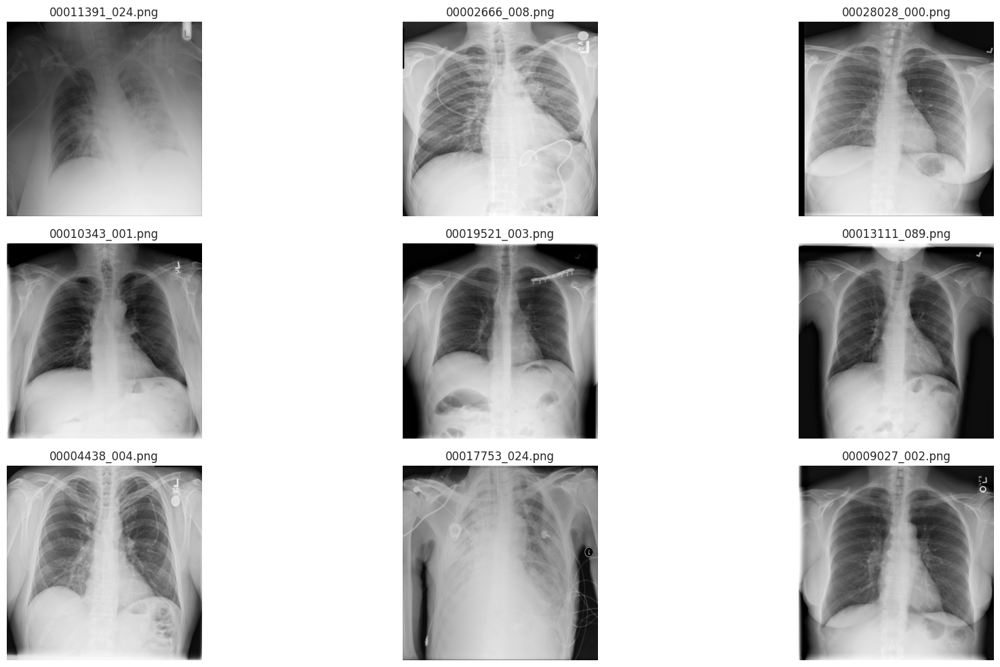

In [ ]:
show_original_images()  # secilen orginal resimleri goster. Array icine atmistim daha once.

**2.2 Rastgele Görüntülerin İstatistiksel Özelliklerini Hesaplama**
- Seçilen görüntülerin her biri için maksimum, minimum, ortalama ve standart sapma değerlerini hesaplayın.

Görüntü işleme ve analizinde, bir görüntünün istatistiksel özelliklerini örneğin, maksimum, minimum, ortalama, standart sapma gibi) bilmek, çeşitli örevlerde faydalıdır. görüntü iyileştirme, segmentasyon, gürültü temizleme gibi işlemleri gerçekleştirmede

Görüntüdeki görsel özelliklerin (kontrast, parlaklık, detay) optimize edilmesi için bu istatistikler sıklıkla kullanılır.

1) Görüntü Kalitesi Değerlendirmesi: Ortalama (mean), standart sapma (standard deviation) ve maksimum (max) eğerler, görüntüdeki parlaklık seviyelerini anlamada faydalıdır.

Ortalama parlaklık, görüntüdeki genel ışık düzeyini gösterir.
Maksimum ve minimum değerler, görüntünün kontrastını anlamada
Standart sapma, görüntüdeki parlaklık varyasyonunu ölçer; düşük bir standart sapma, homojen bir aydınlık düzeyi gösterirken, yüksek bir standart sapma daha fazla kontrast ve varyasyon olduğunu gösterir.
2) Görüntü Segmentasyonu ve Eşikleme: 3) Görüntü Gürültü Analizi ve Temizleme: Standart sapma, görüntüdeki gürültü düzeyini anlamada faydalıdır. Örneğin, Gaussian gürültüsü gibi rastgele gürültülerin analiz edilmesinde, görüntünün standart sapması önemli bir gösterge olabilir. 4) Kenarlık Algılama ve Görüntü Özellikleri: Görüntüdeki kenarları veya detayları tespit etmek için, genellikle görüntüdeki farklı piksellerin değerleri karşılaştırılır. Ortalama, maksimum ve minumum değerler, kenarları bulmaya veya öznitelik çıkarımına yardımcı olabilir. 5) Normalizasyon ve Görüntü İyileştirme: Görüntüdeki piksel değerlerinin normalizasyonu için, görüntünün min ve max değerleri kullanılarak yeniden ölçeklendirme yapılabilir. Bu işlem, özellikle görüntüdeki parlaklık seviyelerinin çok düşük ya da çok yüksek olduğu durumlarda faydalıdır.

6) Görüntülerin Karşılaştırılması: İki görüntü arasındaki farkları anlamak için, her iki görüntünün istatistiksel özelliklerini karşılaştırabilirsiniz

*7) Görüntülerin Histogram Analizi: * Görüntülerin histogramlarını incelediğinizde, görüntüdeki ortalama piksel değeri ve standart sapma gibi istatistikler, görüntüdeki genel dağılım hakkında bilgi verir.

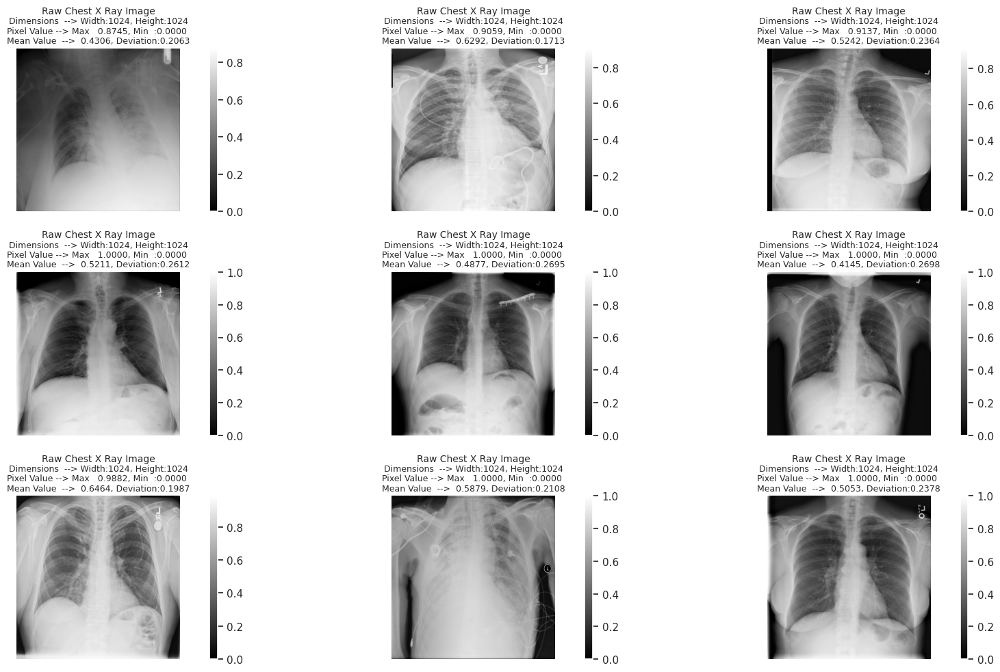

In [ ]:
def img_statistic(image):
  sample_img = images_array[image]
  raw_image = plt.imread(os.path.join('nih/images_small/', sample_img))
  plt.imshow(raw_image, cmap='gray')
  plt.colorbar()
  plt.text(0.5, 1.20, "Raw Chest X Ray Image", ha='center', va='bottom', transform=plt.gca().transAxes, fontsize=10)
  plt.text(0.5, 1.14, f"Dimensions  --> Width:{raw_image.shape[0]}, Height:{raw_image.shape[1]}", ha='center', va='bottom', transform=plt.gca().transAxes, fontsize=9)
  plt.text(0.5, 1.08, f"Pixel Value --> Max   {raw_image.max():.4f}, Min  :{raw_image.min():.4f} ", ha='center', va='bottom', transform=plt.gca().transAxes, fontsize=9)
  plt.text(0.5, 1.02, f"Mean Value  -->  {raw_image.mean():.4f}, Deviation:{raw_image.std():.4f}", ha='center', va='bottom', transform=plt.gca().transAxes, fontsize=9)

plt.figure(figsize=(20,10))
# Iterate and plot random images
for i in range(9):
  plt.subplot(3, 3, i + 1)
  plt.imshow(img, cmap='gray')
  img_statistic(i) # function' a gidip her bir resim icin datayi cekiyor.
  plt.axis('off')
  plt.tight_layout()
#img_statistic(1)

**2.3. Histogram Çizimi**
 - Seçilen 9 görüntünün her biri için piksel yoğunluk dağılımını gösteren histogramlar oluşturun.

Histogram
Görüntü işleme (image processing) alanında, bir görüntünün parlaklık dağılımını veya piksellerin yoğunluğunu görselleştirmek için kullanılır.

1) Görüntü Kontrastını Analiz Etme :

Görüntüdeki piksellerin yoğunluğu ile ilgili bilgi verir.
Eğer histogram dar bir aralığa yoğunlaşmışsa, bu durum düşük kontrast anlamına gelir. Yani görüntüdeki çoğu piksel benzer parlaklık değerlerine sahiptir.
Eğer histogram, geniş bir aralığa yayılmışsa, görüntüdeki yüksek kontrast ve farklı parlaklık değerlerinin varlığına işaret eder.
2) Görüntü Aydınlatmasını (Işıklandırmayı) Değerlendirme:

Eğer histogram çoğunlukla sol tarafta yoğunlaşıyorsa, bu durum görüntünün karanlık olduğunu gösterir.
Eğer histogram çoğunlukla sağ tarafta yoğunlaşmışsa, bu durumda görüntü çok parlak olabilir.
Histogramdaki sıkışmışlık veya dağılım görüntünün aydınlatma düzeyinin doğru olup olmadığını anlamaya yardımcı olur.
3) Görüntü Eşikleme (Thresholding) ve Segmentasyon :

Histogram eşikleme, görüntüdeki nesneleri veya belirli bölgeleri ayırt etmek için sıklıkla kullanılır. Histogram üzerinde belirli bir eşik değeri seçilerek, bu değerin altındaki pikseller arka plan, üstündeki pikseller ise nesneler olarak ayrılabilir.
Örneğin, Otsu’nun Yöntemi gibi otomatik eşikleme algoritmalarında, görüntüdeki düşük frekanslı ve yüksek frekanslı bileşenler arasındaki farkları tespit etmek için histogram kullanılır.
4) Görüntü İyileştirme (Image Enhancement):

Histogramlar, görüntü iyileştirme tekniklerinde de sıkça kullanılır. Özellikle:Histogram eşitleme (Histogram Equalization): Bu işlem, görüntünün kontrastını artırmak amacıyla yapılır. Görüntünün histogramını daha dengeli hale getirir, böylece parlaklık değerleri daha geniş bir aralığa yayılır ve daha belirgin hale gelir.
Histogram Gerçekleştirme (Histogram Matching): İki farklı görüntünün histogramlarını birbirine uyarlamak amacıyla kullanılır. Örneğin, bir görüntünün histogramı başka bir görüntüye benzetilebilir.
5) Görüntüdeki Gürültüleri ve Hataları Tespit Etme:

Gürültü (noise), görüntüdeki istenmeyen rastgele değişiklikleri ifade eder. Histogramlar, gürültünün varlığını tespit etmek için kullanılabilir.
Eğer histogramda beklenmedik pikseller (örneğin, sıfır ya da maksimum parlaklıkta çok fazla piksel) varsa, bu, görüntüdeki sıçrama gürültüsü veya beyaz/siyah gürültü gibi hataları gösterebilir.
6) Görüntüdeki Detayları veya Özellikleri Çıkarmak

Görüntü analizi için histogramlar, görüntüdeki detayların belirginleşmesine yardımcı olabilir. Örneğin, bir görüntüdeki kenarlar veya doku gibi özellikler histogram üzerinde belirli bir aralıkta yoğunlaşabilir.
Yüksek frekanslı detaylar (örneğin, keskin kenarlar ve ince yapılar) histogramın sağ tarafına, düşük frekanslı bileşenler (yumuşak geçişler ve pürüzsüz alanlar) sol tarafına yakın olabilir.
7) Görüntü Anlamlılık (Image Normalization) :

Görüntüdeki piksellerin yeniden ölçeklenmesi veya normalizasyonu işlemleri de histogramlar ile yapılabilir.
Min-Max Normalizasyonu: Görüntüdeki minimum ve maksimum piksel değerlerine göre her piksel değeri bir aralığa (örneğin 0-255) yeniden ölçeklendirilebilir.
Z-Score Normalizasyonu: Görüntüdeki piksellerin ortalama ve standart sapma kullanılarak normalizasyonu yapılabilir.
8) Görüntü Filtreleme ve Gürültü Temizleme

Frekans bazlı filtreleme (örneğin, düşük frekanslı filtreleme), histogramda bulunan düşük frekanslı bileşenlerin çıkarılmasına dayanabilir. Bu sayede, yüksek frekanslı gürültüleri temizleyebiliriz.
Ayrıca, geometrik filtreler (örneğin, medyan filtresi) ve frekans filtreleri ile yapılan işlemler histogramdaki gürültü piklerini ortadan kaldırmayı hedefler.

In [ ]:
def img_histogram(image):
  raw_image = plt.imread(os.path.join('nih/images_small/', images_array[image]))
  sns.histplot(raw_image.ravel(),
             label=f'Pixel Mean {np.mean(raw_image):.4f} & Standard Deviation {np.std(raw_image):.4f}', kde=False)
  plt.legend(loc='upper center', fontsize=11)
  plt.title('Distribution of Pixel Intensities in the Image',fontsize=9, fontweight='bold')
  plt.xlabel('Pixel Intensity', fontsize=9, fontweight='light')
  plt.ylabel('# Pixels in Image',fontsize=9, fontweight='light' )

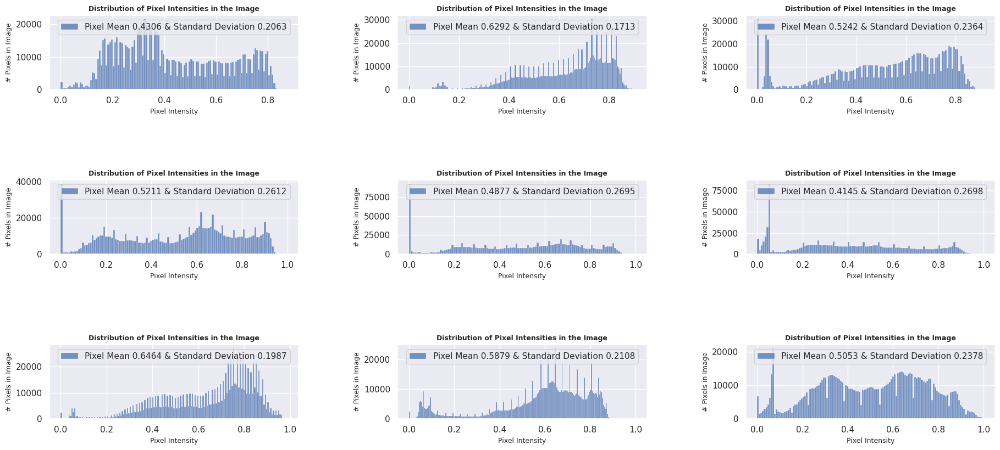

In [ ]:
plt.figure(figsize=(20,10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    img_histogram(i)  # function a gidip her bir image icin histogram ciziyor.
#plt.axis('off')
plt.tight_layout(pad=6.0,)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)
plt.show()

# **3. Görüntü İşleme ve İyileştirme**

**3.1. Kontrast Germe (Stretching)**
 - Minimum ve maksimum piksel değerlerini kullanarak kontrast germe işlemi yapın.
 3.2. Histogram Eşitleme (Equalization)
**bold text** - Kontrast germe işlemi sonrası histogram eşitleme uygulayarak kontrastı artırın.

In [ ]:
def image_proccess(image):
  # Calculate minimum and maximum for contrast stretching
#

  raw_image = plt.imread(os.path.join('nih/images_small/', images_array[image]))

  min_val, max_val = raw_image.min(), raw_image.max()

  # Step 1: Apply contrast stretching
  min_val, max_val = raw_image.min(), raw_image.max()
  contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
  contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

  # Step 2: Apply histogram equalization after contrast stretching
  # Step 2: Apply histogram equalization using skimage
  equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
  equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]


  # Step 3: Apply gamma correction on the equalized image
  gamma = 1.1  # Adjust gamma value as needed --> gamma correction is a technique used to adjust the brightness and contrast of an image.
                #Gamma < 1 brightens the image, while gamma > 1 darkens the image.
                #A gamma value of 1 keeps the image unchanged.
  gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
  gamma_corrected = gamma_corrected.astype(np.uint8)

  # Plot original image and histogram
  plt.figure(figsize=(18, 10))
  plt.subplot(2, 4, 1) # (nrows, ncols, index) nrows: The number of rows in the subplot grid.
                                                  # ncols: The number of columns in the subplot grid.
                                                  # index: The position of the current subplot, starting from 1 (top-left) and counting left to right, top to bottom.
                                                  # (2, 4, 1)  # 2 rows, 4 columns, position 1
  plt.imshow(raw_image, cmap='gray')
  plt.title('Original Image')
  plt.colorbar()
  plt.subplot(2, 4, 5)
  plt.hist(raw_image.ravel(), bins=256, color='gray')
  plt.title("Original Image Histogram")

  # Plot contrast-stretched image and histogram
  plt.subplot(2, 4, 2)
  plt.imshow(contrast_stretched, cmap='gray')
  plt.title('Contrast-Stretched Image')
  plt.colorbar()
  plt.subplot(2, 4, 6)
  plt.hist(contrast_stretched.ravel(), bins=256, color='gray')
  plt.title("Contrast-Stretched Histogram")

  # Plot contrast-equalized image and histogram
  plt.subplot(2, 4, 3)
  plt.imshow(equalized_image, cmap='gray')
  plt.title('Contrast Equalized Image')
  plt.colorbar()
  plt.subplot(2, 4, 7)
  plt.hist(equalized_image.ravel(), bins=256, color='gray')
  plt.title("Equalized Histogram")

  # Plot gamma-corrected image and histogram
  plt.subplot(2, 4, 4)
  plt.imshow(gamma_corrected, cmap='gray')
  plt.title(f'Gamma-Corrected Image (Gamma={gamma})')
  plt.colorbar()
  plt.subplot(2, 4, 8)
  plt.hist(gamma_corrected.ravel(), bins=256, color='gray')
  plt.title("Gamma-Corrected Histogram")

  plt.tight_layout()
  plt.show()

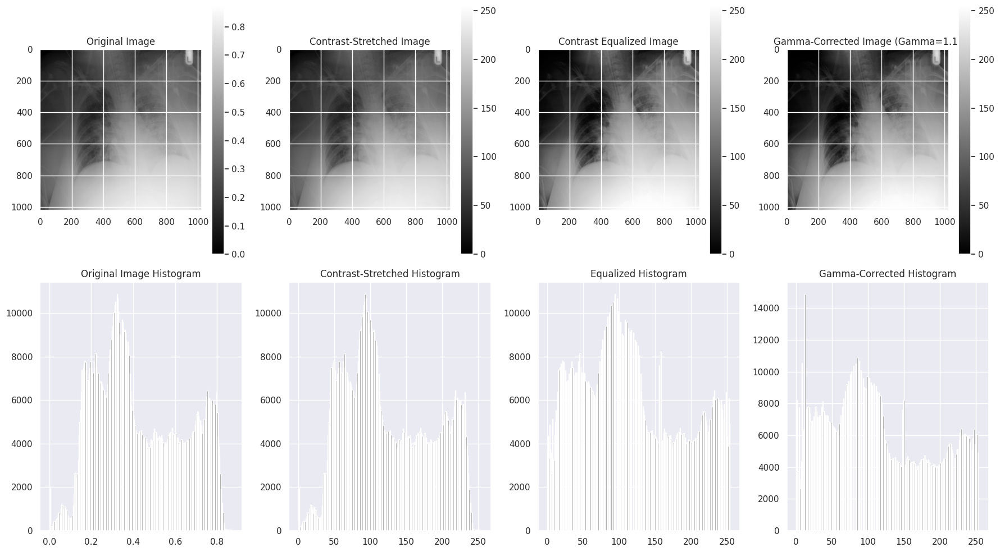

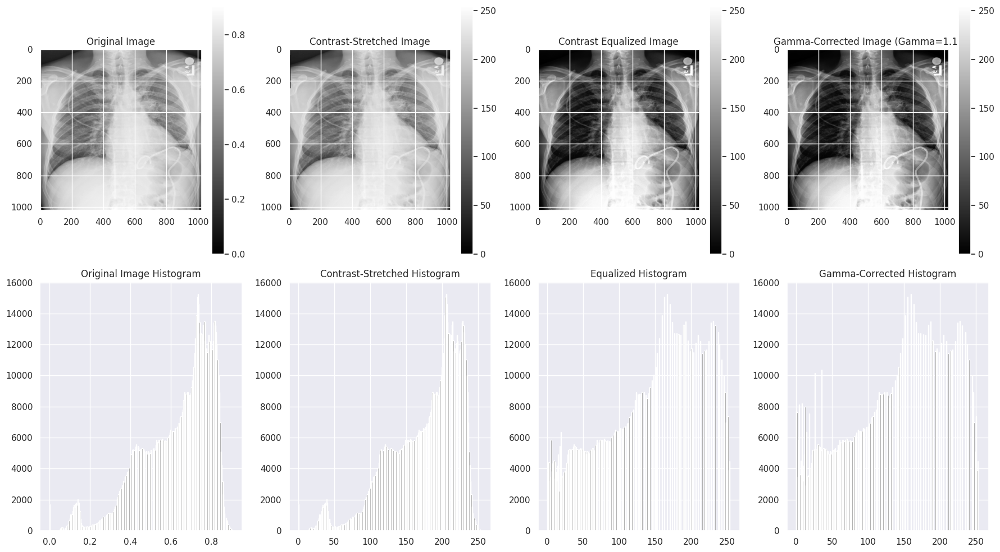

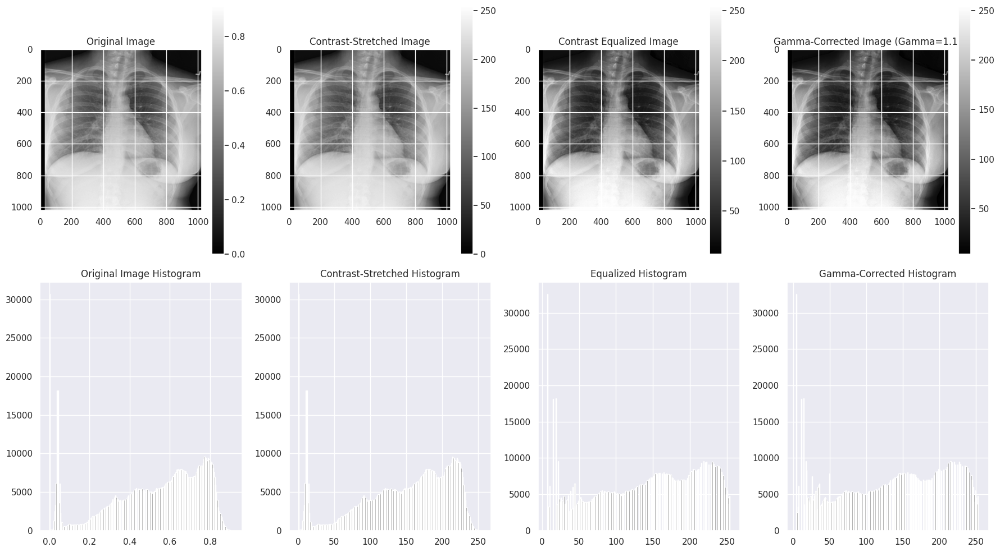

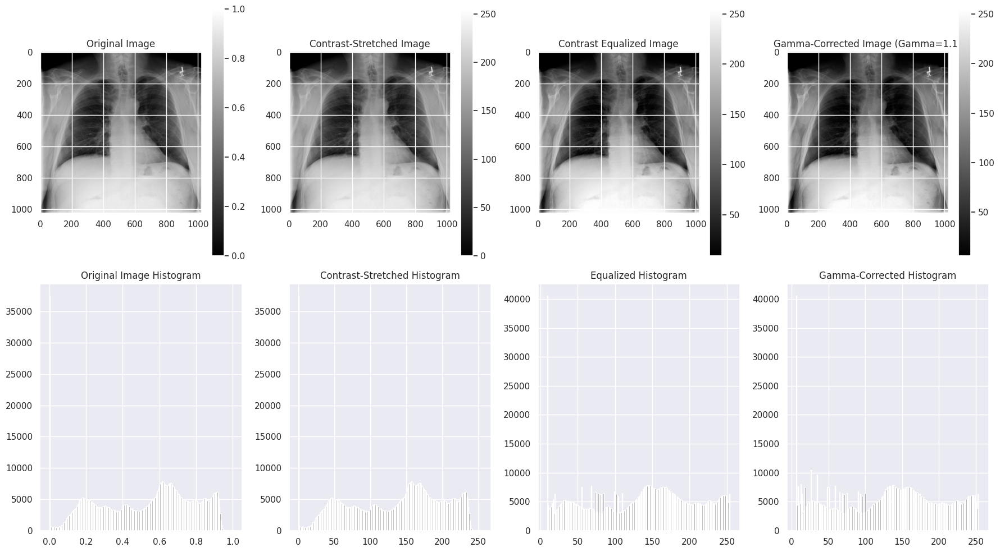

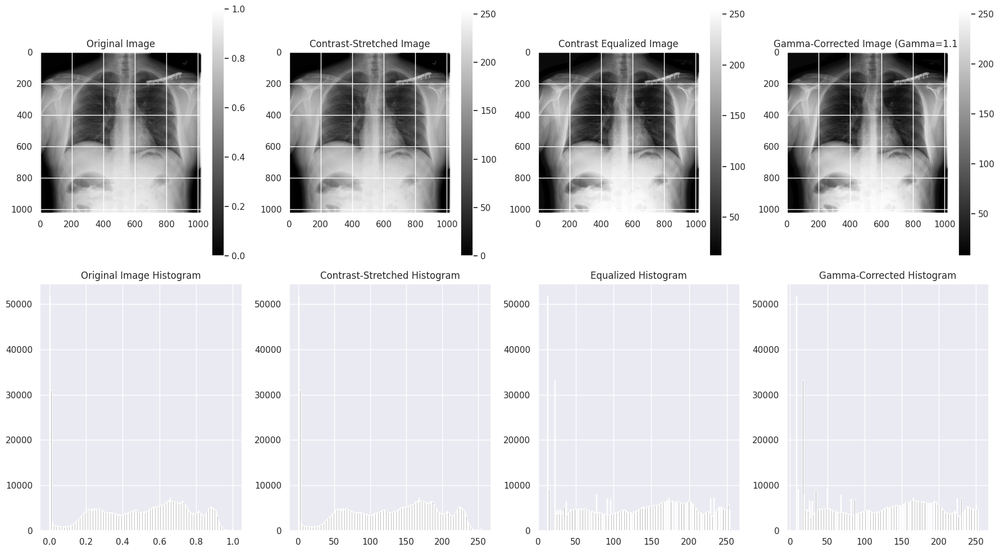

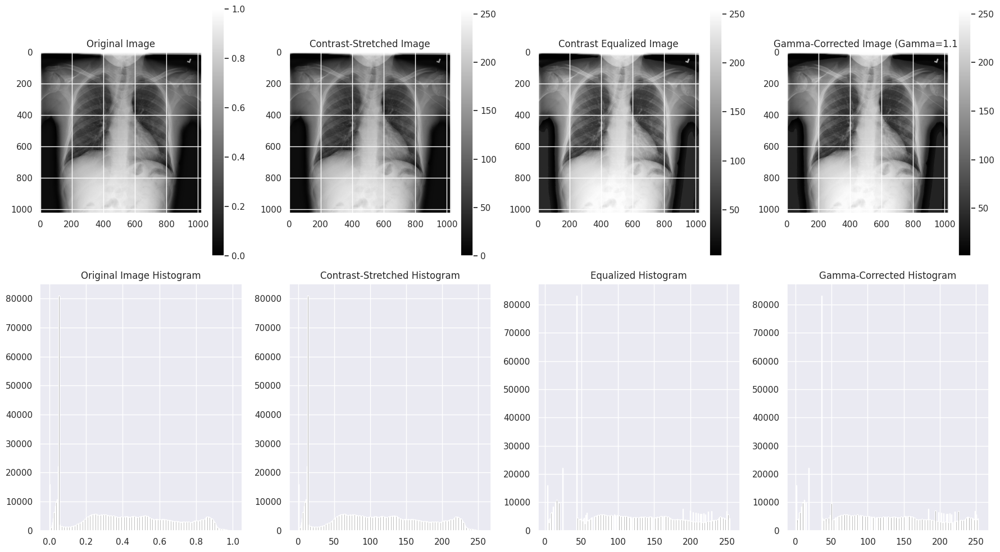

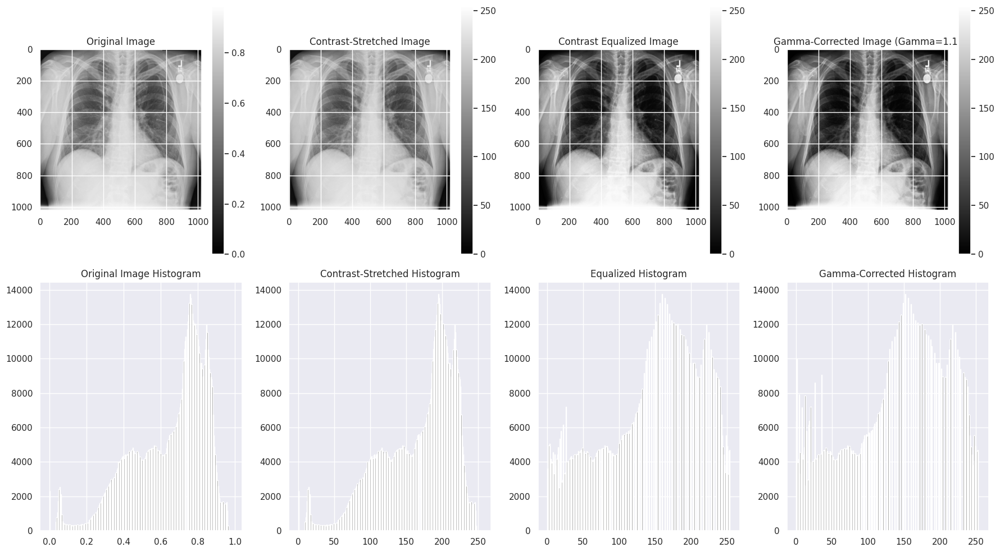

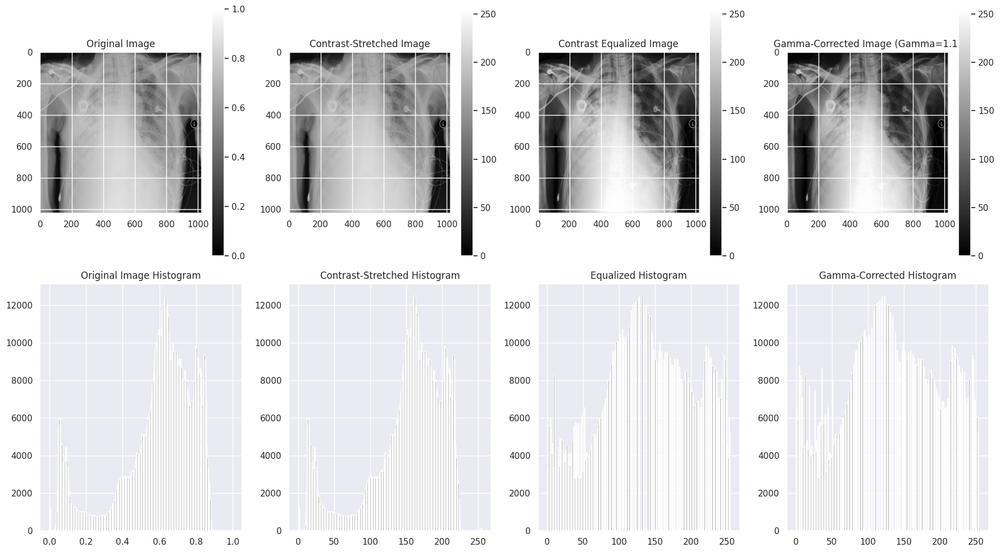

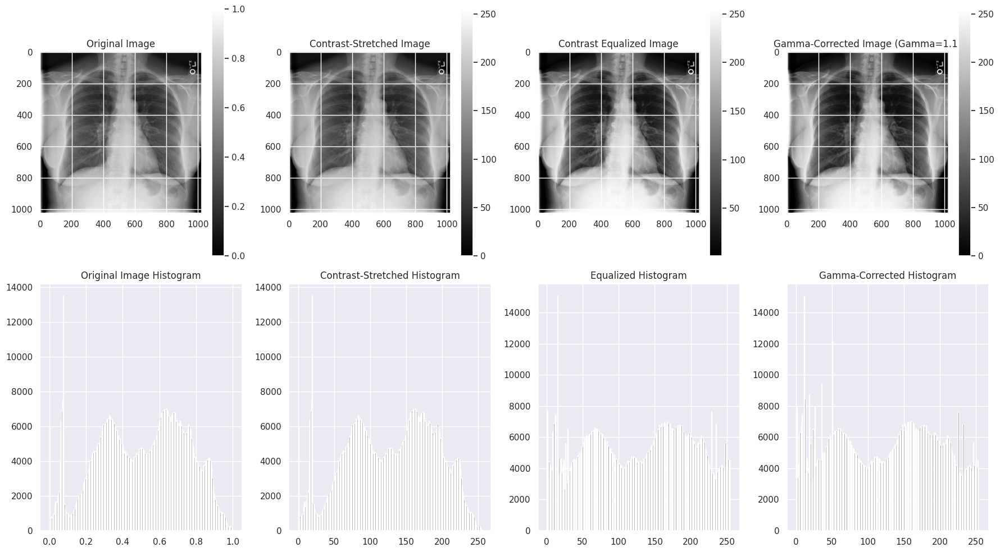

In [ ]:
for i in range(9):
  image_proccess(i)

# **4. Gürültü Azaltma**

**4.1. Median ve Gaussian Blur Uygulama**
 - Gamma düzeltilmiş görüntüye median ve gaussian blur uygulayın ve sonuçları karşılaştırın.

In [ ]:
# 4.1 Gürültü Azaltma (Median ve Gaussian Blur Uygulama)
def median_gaussian_blur(image):
  raw_image = plt.imread(os.path.join('nih/images_small/', images_array[image]))
  min_val, max_val = raw_image.min(), raw_image.max()
  contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
  contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization
  equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
  equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]
  gamma = 1.1  # Adjust gamma value as needed --> gamma correction is a technique used to adjust the brightness and contrast of an image.
                  #Gamma < 1 brightens the image, while gamma > 1 darkens the image.
                  #A gamma value of 1 keeps the image unchanged.
  gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
  gamma_corrected = gamma_corrected.astype(np.uint8)

  # Apply Median Filtering
  median_filtered = cv2.medianBlur(gamma_corrected, 5)

  # Apply Gaussian Blur
  gaussian_filtered = cv2.GaussianBlur(gamma_corrected, (5, 5), 0)

  # Display Results
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1), plt.imshow(median_filtered, cmap='gray'), plt.title("Median Filtered Image")
  plt.subplot(1, 2, 2), plt.imshow(gaussian_filtered, cmap='gray'), plt.title("Gaussian Filtered Image")
  plt.show()

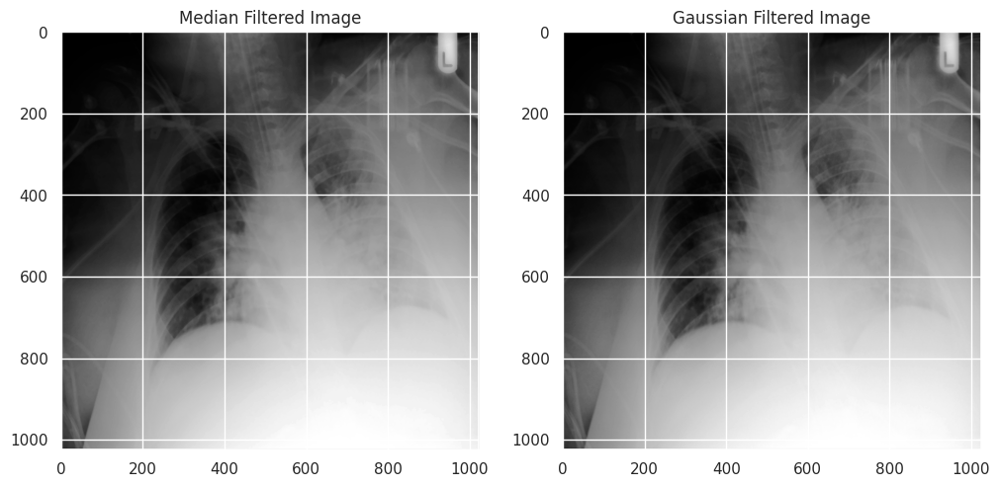

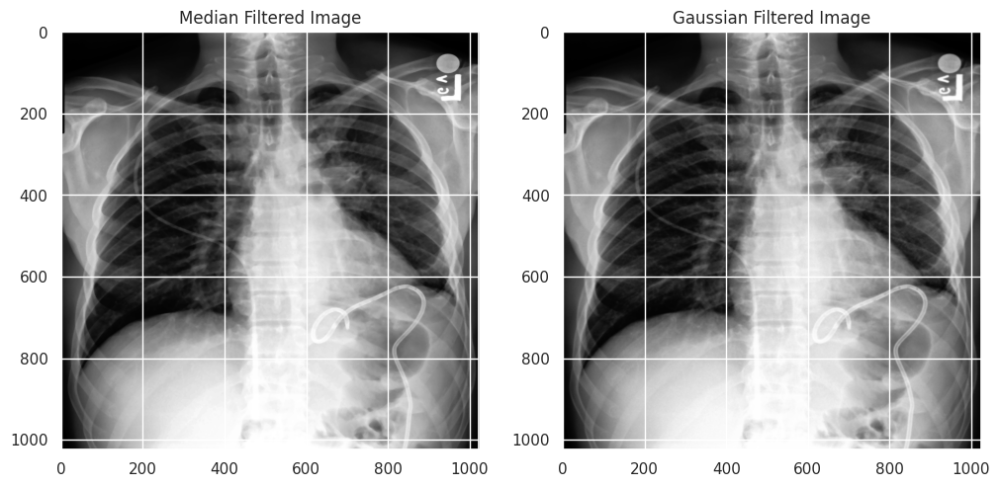

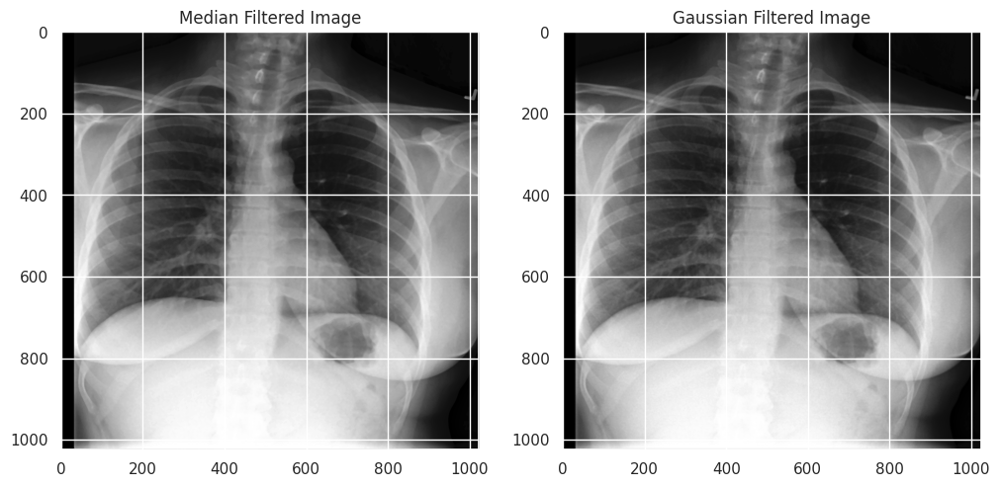

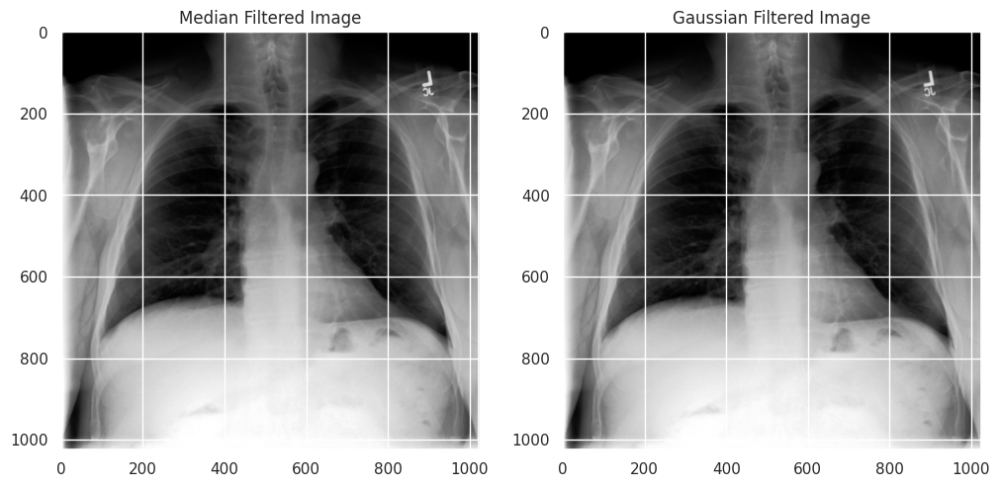

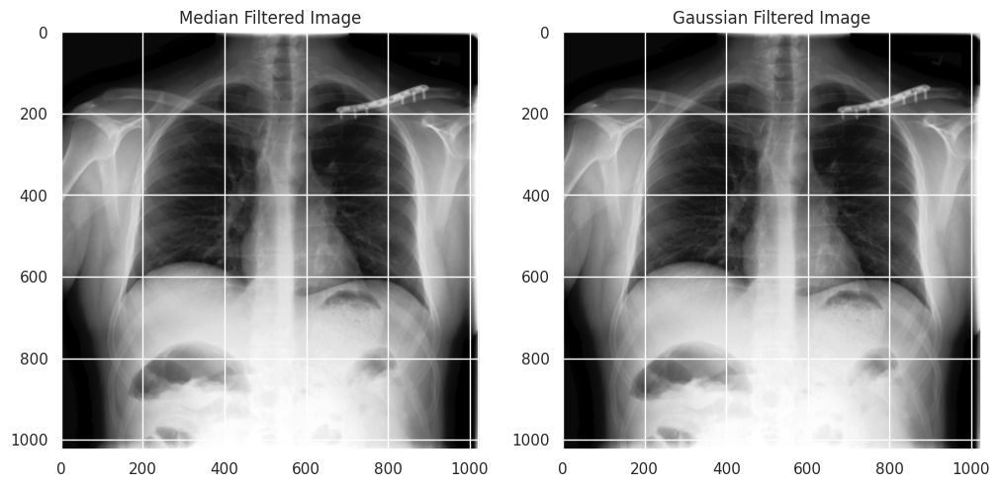

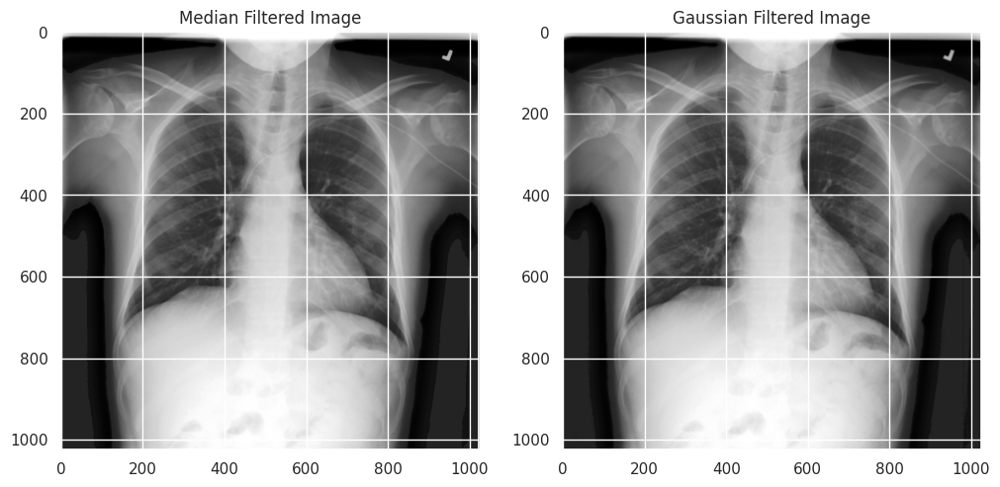

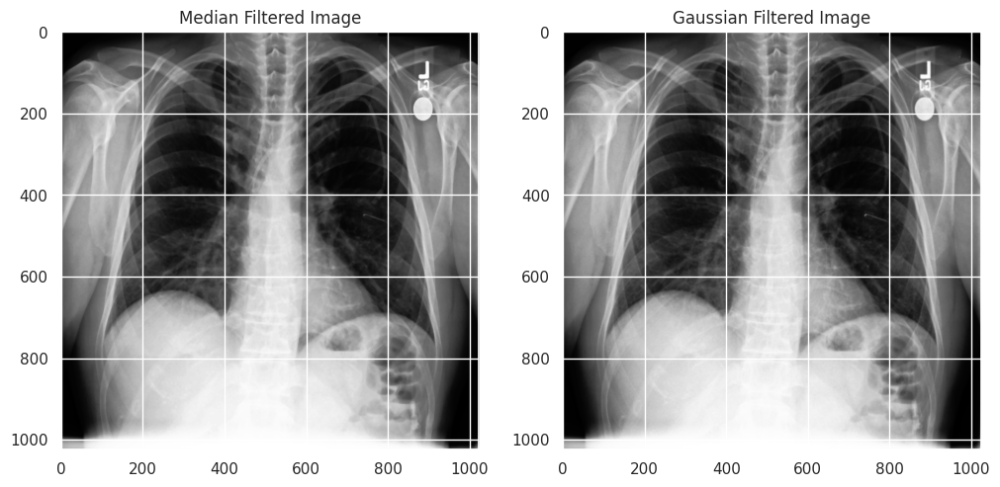

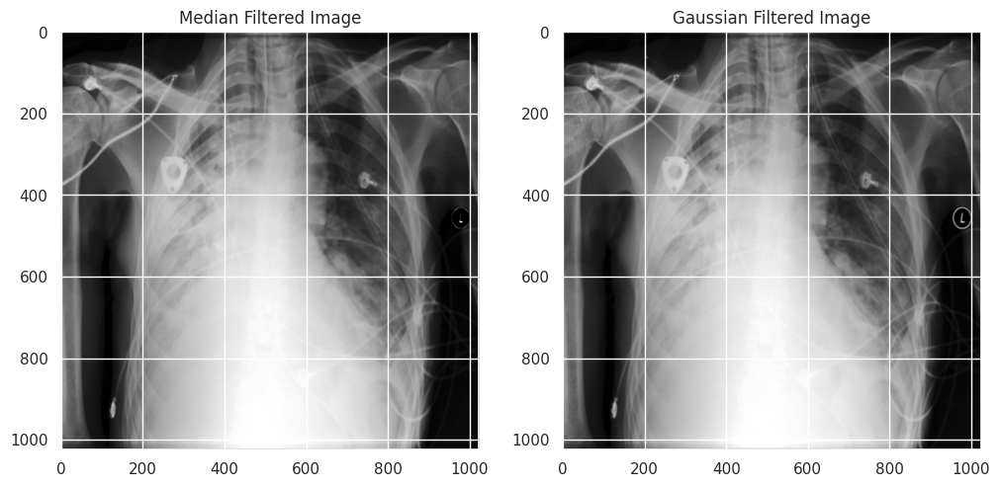

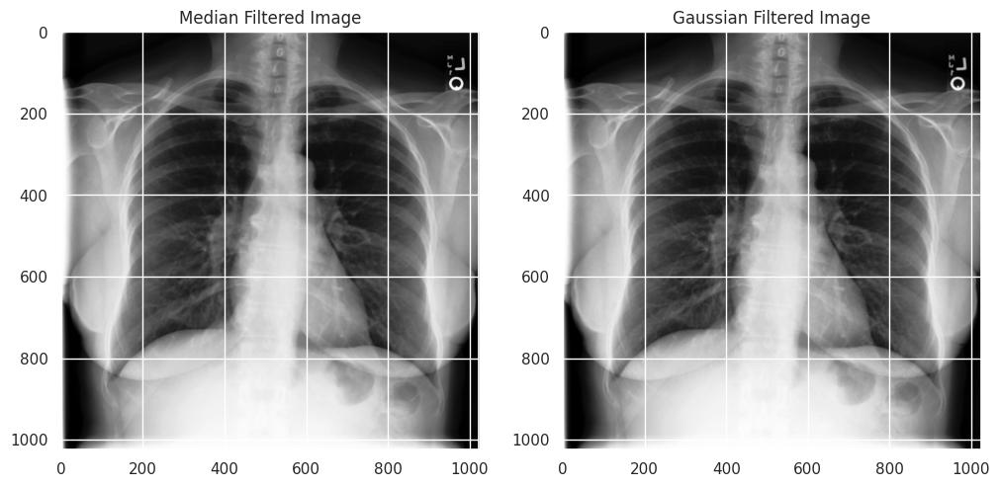

In [ ]:
for i in range(9):
  median_gaussian_blur(i)

*Median ve Gaussian Blur *
Median ve Gaussian blur (ya da Gaussian filtresi), görüntü işleme ve bilgisayarla görme alanlarında sıkça kullanılan, görüntülerdeki gürültüleri (noise) azaltmak amacıyla uygulanan iki önemli blur (bulanıklaştırma) tekniğidir. Her iki yöntem de, görüntülerdeki detayları koruyarak, gürültüyü azaltmayı hedefler. Ancak, her birinin kendine özgü avantajları ve kullanım alanları vardır.

1) Median Blur (Medyan Bulanıklaştırma) Medyan bulanıklaştırma, genellikle görüntüdeki salt-and-pepper gürültüsü (beyaz ve siyah noktalar) gibi rastgele bozulmalar veya anomaliler (gürültü) ile başa çıkmak için kullanılır. Medyan filtreleme, her bir pikselin değerini, o pikselle ilişkili komşu piksellerin medyan değeriyle değiştiren bir tekniktir.

- Gürültü azaltma: Medyan filtresi, görüntüdeki gürültüyü etkili bir şekilde ortadan kaldırır çünkü gürültü genellikle çok yüksek veya çok düşük değerlerdir, bu da medyan filtresinin avantajıdır. Medyan, bu uç değerleri yok sayarak daha anlamlı ve uyumlu bir pikselleştirme yapar.

Kenarları koruma: Medyan filtre, özellikle keskin kenarları korur. Bu, medyanın her pikselle ilişkili komşuların ortasında bulunan değeri alması nedeniyle, çok fazla keskin kenar bozulmasına neden olmaz.

*Ne Zaman Kullanılır? : *

Salt-and-pepper gürültüsü gibi rastgele, yüksek-ya da düşük değere sahip pikselleri ortadan kaldırmak istediğinizde.
Keskin kenarları bozmadan, özellikle uzun çizgiler veya detaylar içeren görüntülerde gürültüyü temizlemek gerektiğinde.
2) Gaussian Blur (Gaussian Bulanıklaştırma) Gaussian Blur, genellikle Gaussian dağılımına dayalı bir ağırlıklı ortalama kullanarak görüntüdeki gürültüyü azaltmak ve detayları yumuşatmak için kullanılır. Bu teknik, bir pikselle ilişkili komşu piksellerin ağırlıklı ortalamasını alır ve ağırlıklar, Gaussian fonksiyonu (zaten düzgün dağılıma sahip bir fonksiyon) ile belirlenir.

Gürültü azaltma: Gaussian filtresi, rastgele gürültü ve düşük frekanslı gürültü (örneğin, bulanık yansımalar veya ışık değişimleri) üzerinde etkilidir.
Yuumuşatma: Görüntüdeki yumuşak geçişler sağlar, yani pikseller arasındaki farkları azaltır. Bu, özellikle görüntüyü yumuşatmak, gölgeleme eklemek ya da görüntüdeki detayları kaybetmek istediğinizde faydalıdır.

Ne Zaman Kullanılır?
Düşük frekanslı gürültüleri (yavaş değişen) ve sistematik hataları temizlemek gerektiğinde.
Görüntüyü yumuşatmak veya bulanıklaştırmak istediğinizde, örneğin arrière plan bulanıklaştırması veya gölgeleme eklemek.

# **5. Döndürme ve Ayna Çevirme (Flipping)**

**5.1. Rastgele Açılarla Döndürme**
- Görüntüyü 0 ile 10 derece arasında rastgele bir açıda döndürün.

**5.2. Ayna Çevirme**
- Görüntüyü yatay olarak çevirin ve sonucu görselleştirin.

In [ ]:
def rotate_and_flipping(image):
  raw_image = plt.imread(os.path.join('nih/images_small/', images_array[image]))
  min_val, max_val = raw_image.min(), raw_image.max()
  contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
  contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization
  equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
  equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]
  gamma = 1.1  # Adjust gamma value as needed --> gamma correction is a technique used to adjust the brightness and contrast of an image.
                    #Gamma < 1 brightens the image, while gamma > 1 darkens the image.
                    #A gamma value of 1 keeps the image unchanged.
  gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
  gamma_corrected = gamma_corrected.astype(np.uint8)
  random_angle_value = np.random.randint(1, 11)  # random rotation between 1 and 10
  #original_angle_value = 0
  # if angle is None:
  #     random_angle_value = np.random.randint(1, 11)
  #     print(f"Angle Value : {angle_value}")
  # else:
  #     angle_value = angle

  # Apply Median Filtering
  median_filtered = cv2.medianBlur(gamma_corrected, 5)
  center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)


  rotation_matrix_original = cv2.getRotationMatrix2D(center, angle=0, scale=1.0)
  rotation_matrix_random = cv2.getRotationMatrix2D(center, angle=random_angle_value, scale=1.0)
  rotation_matrix_270 = cv2.getRotationMatrix2D(center, angle=270, scale=1.0)

  original_image = cv2.warpAffine(median_filtered, rotation_matrix_original, (median_filtered.shape[1], median_filtered.shape[0]))
  random_rotated_image = cv2.warpAffine(median_filtered, rotation_matrix_random, (median_filtered.shape[1], median_filtered.shape[0]))
  rotated_image_270 = cv2.warpAffine(median_filtered, rotation_matrix_270, (median_filtered.shape[1], median_filtered.shape[0]))
  # Horizontal Flip
  flipped_horizontal = cv2.flip(median_filtered, 1)

  # Display Results
  plt.figure(figsize=(18, 12))
  plt.subplot(1, 3, 1), plt.imshow(original_image, cmap='gray'), plt.title("Original Image")
  plt.subplot(1, 3, 2), plt.imshow(random_rotated_image, cmap='gray'), plt.title(f"Random Rotated Image : {random_angle_value} degree")
  plt.subplot(1, 3, 3), plt.imshow(rotated_image_270, cmap='gray'), plt.title("Horizontally Flipped Image")

  plt.show()

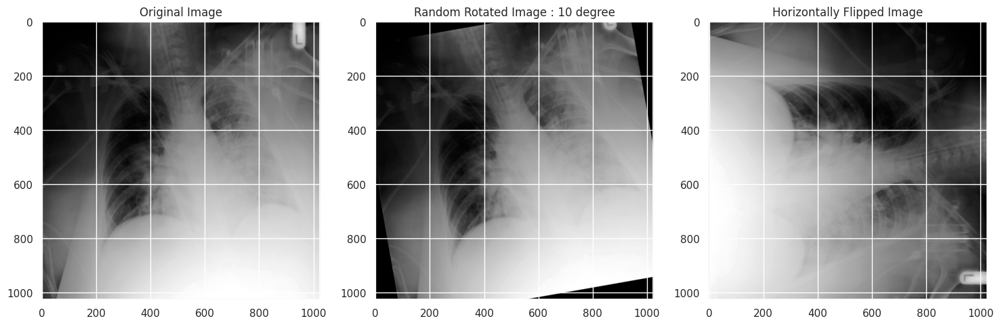

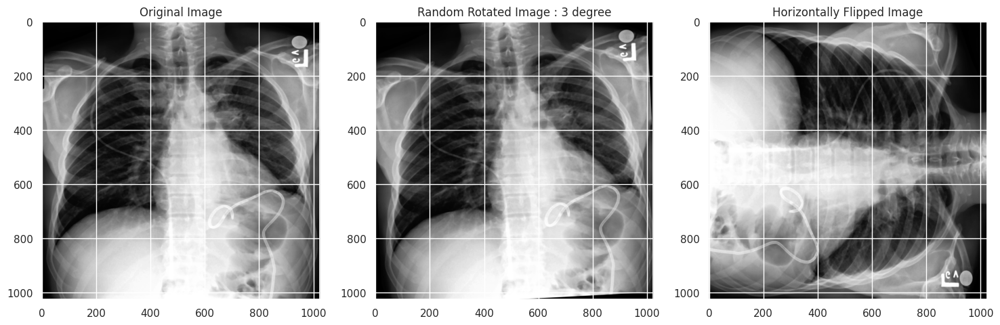

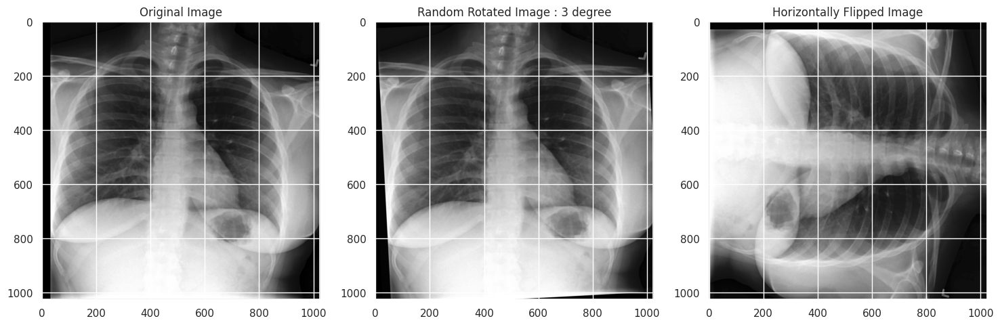

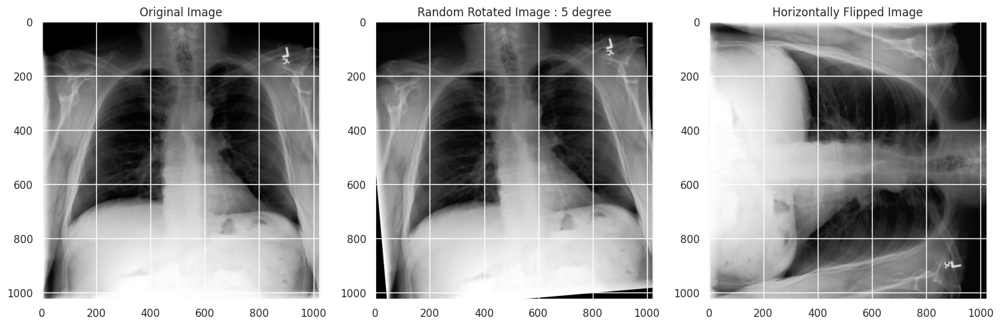

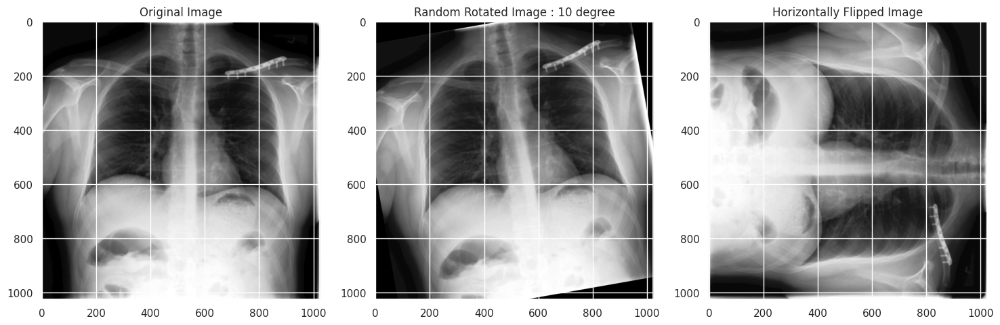

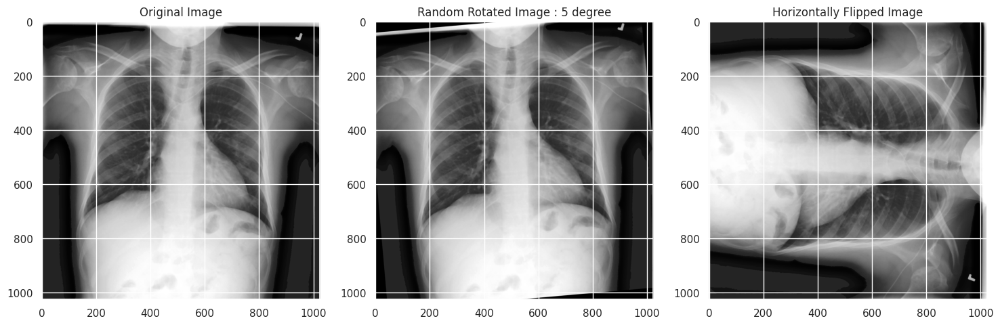

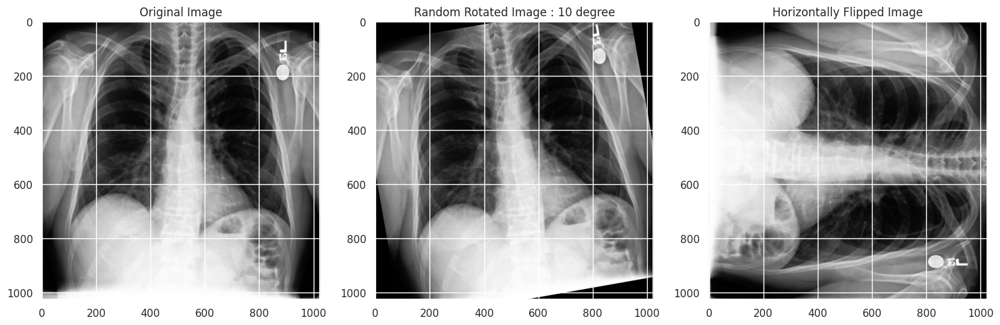

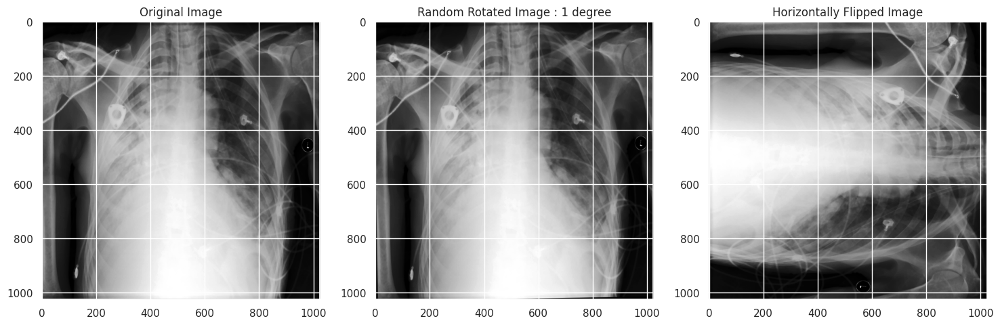

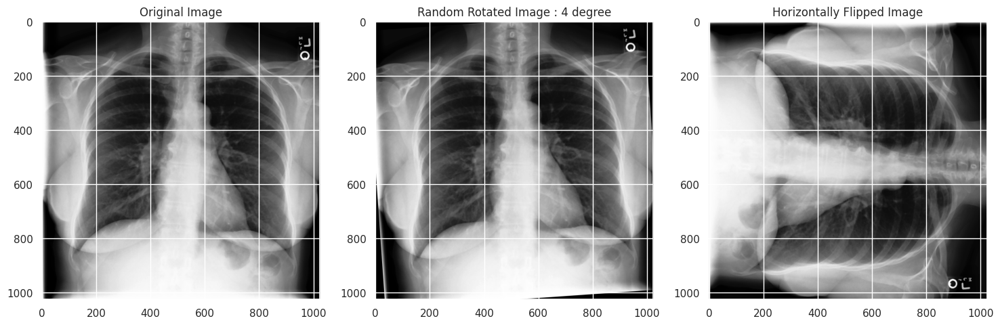

In [ ]:
# 5.1 Döndürme ve Çevirme (Flipping)
for i in range(9):
  rotate_and_flipping(i)

# **6. Frekans Alanında Filtreleme**

**6.1 Fourier Dönüşümü ve Filtreleme**
Fourier dönüşümü ile görüntüyü frekans alanına çevirin, düşük frekansları geçiren bir maske uygulayın, ardından ters Fourier dönüşümü ile frekans alanında filtreleme yapın.

**Fourier Dönüşümünün Temel Amacı**
Fourier dönüşümünün temel amacı, bir sinyaldeki frekans bileşenlerini tanımlamak ve bu bileşenlerin her birinin genlik ve faz bilgilerini elde etmektir.

Zaman domaini: Bir sinyalin değerlerinin zamanla nasıl değiştiğini gösterir. Örneğin, bir ses kaydındaki ses dalgasının zamanla değişimi.
Frekans domaini: Aynı sinyali, içerdiği frekans bileşenlerine ayırarak gösterir. Hangi frekansların dominant olduğunu anlamamızı sağlar.

Fourier Dönüşümünün Kullanım Alanları

- Görüntü işleme alanında Fourier dönüşümü, bir görüntünün frekans bileşenlerine ayrılmasını sağlar. Bu, görüntüdeki belirli özellikleri analiz etmek veya işlemek için kullanılabilir. Örneğin:

- Görüntüdeki gürültülerin giderilmesi: Gürültü genellikle yüksek frekans bileşenlerinden gelir, bu yüzden Fourier dönüşümü kullanarak yüksek frekansları filtreleyebiliriz.

- Görüntü netleştirme: Görüntüdeki bulanıklık veya bozulmalar düşük frekans bileşenlerinden kaynaklanıyorsa, yüksek frekanslar üzerinde işlem yaparak bunları iyileştirebiliriz.

- Görüntü sıkıştırma: Fourier dönüşümü, görüntüdeki gereksiz frekans bileşenlerini kaldırarak görüntü sıkıştırma tekniklerinde kullanılır.

In [ ]:
#6.1 Frekans Alanında Filtreleme
#    Fourier Dönüşümü ve Filtreleme
#    Fourier dönüşümü ile görüntüyü frekans alanına çevirin, düşük frekansları geçiren bir maske uygulayın, ardından ters Fourier dönüşümü ile frekans alanında filtreleme yapın.
# Apply Fourier Transform and shift it to center low frequencies

def frequency_filter(image):
    # Load the raw image
    raw_image = plt.imread(os.path.join('nih/images_small/', images_array[image]))

    # Ensure the image is grayscale
    if len(raw_image.shape) == 3:
        raw_image = cv2.cvtColor(raw_image, cv2.COLOR_BGR2GRAY)

    # Apply DFT and shift to center low frequencies
    dft = cv2.dft(np.float32(raw_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shifted = np.fft.fftshift(dft)

    # Create a mask for the frequency domain
    rows, cols = raw_image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)  # Two channels for complex numbers
    mask[crow-30:crow+30, ccol-30:ccol+30] = 1  # Center frequencies pass

    # Apply the mask and perform inverse DFT
    fshift = dft_shifted * mask
    f_ishift = np.fft.ifftshift(fshift)
    filtered_image = cv2.idft(f_ishift)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])

    # Normalize the filtered image to display it properly
    filtered_image = cv2.normalize(filtered_image, None, 0, 255, cv2.NORM_MINMAX)
    filtered_image = np.uint8(filtered_image)

    # Display the filtered image
    plt.figure(figsize=(10, 5))
    plt.imshow(filtered_image, cmap='gray')
    plt.title("Frequency Domain Filtered Image")
    plt.axis("off")
    plt.show()

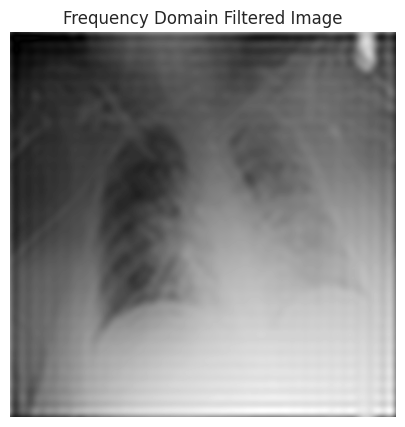

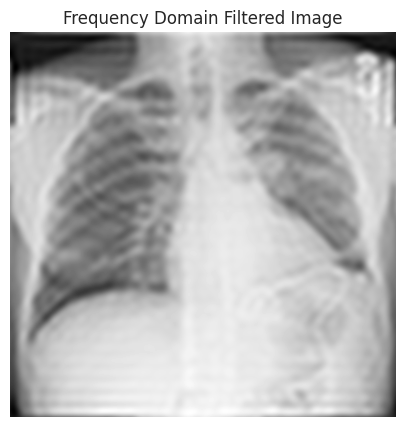

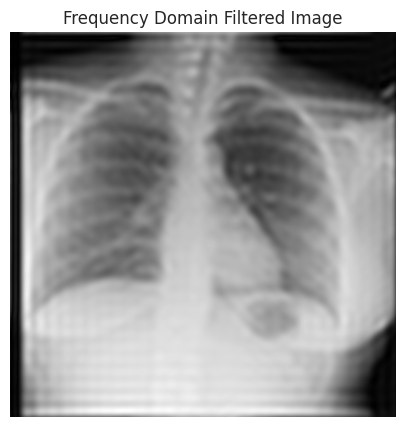

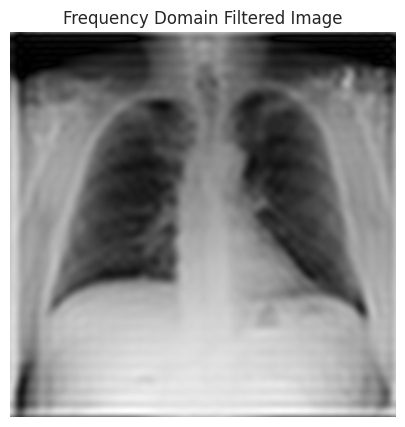

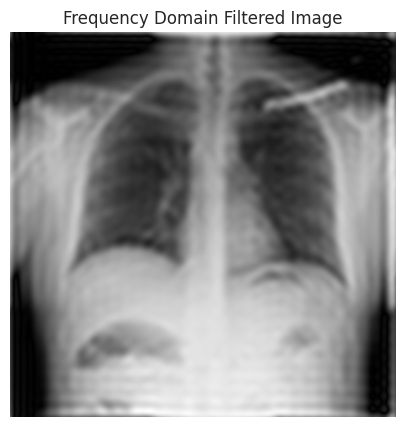

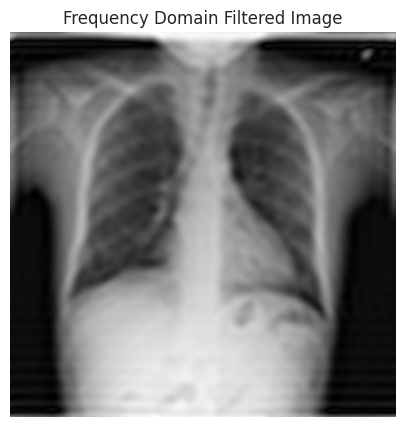

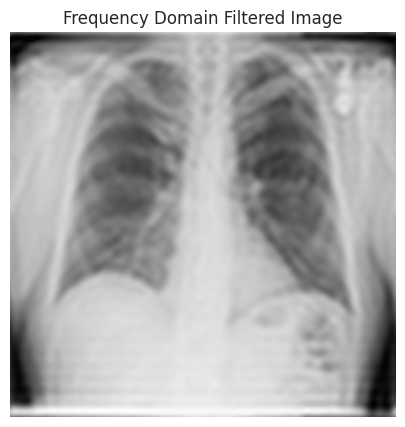

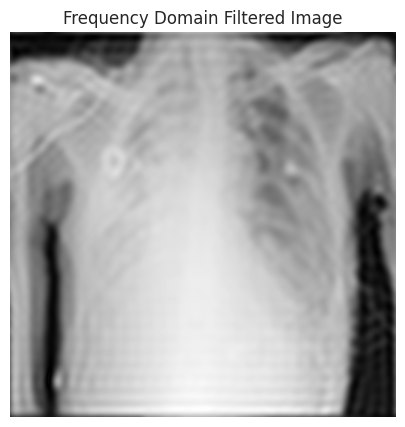

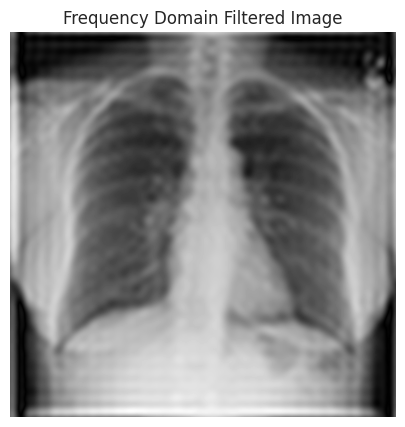

In [ ]:
# Shows frequenced images.
#frequency_filter(1)
for i in range(9):
  frequency_filter(i)

# **7. Keskinleştirme ve Enterpolasyon**

7.1. Keskinleştirme
- Unsharp masking tekniği kullanarak görüntüyü keskinleştirin.
7.2. Bicubic Enterpolasyon
- Keskinleştirilmiş görüntüyü iki kat büyüterek enterpolasyon uygulayın.

In [ ]:
def apply_sharpening(image):
  raw_image = plt.imread(os.path.join('nih/images_small/', images_array[image]))
  min_val, max_val = raw_image.min(), raw_image.max()
  contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
  contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization
  equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
  equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]
  gamma = 1.1  # Adjust gamma value as needed --> gamma correction is a technique used to adjust the brightness and contrast of an image.
                        #Gamma < 1 brightens the image, while gamma > 1 darkens the image.
                        #A gamma value of 1 keeps the image unchanged.
  gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
  gamma_corrected = gamma_corrected.astype(np.uint8)

  sharpening_kernel = np.array([[-1, -1, -1],
                                [-1,  9, -1],
                                [-1, -1, -1]])
  sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, sharpening_kernel), 0, 255).astype(np.uint8)

  # Step 5: Apply bicubic interpolation to upscale the image by a factor of 2
  scale_factor = 2
  resized_image = zoom(sharpened_image, scale_factor, order=3)  # Bicubic interpolation with `order=3`

  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1), plt.imshow(sharpened_image, cmap='gray'),plt.title("Sharpened Image")
  plt.subplot(1, 2, 2), plt.imshow(resized_image, cmap='gray'),plt.title("Interpolated (Upscaled) Image")


  plt.tight_layout()
  plt.show()

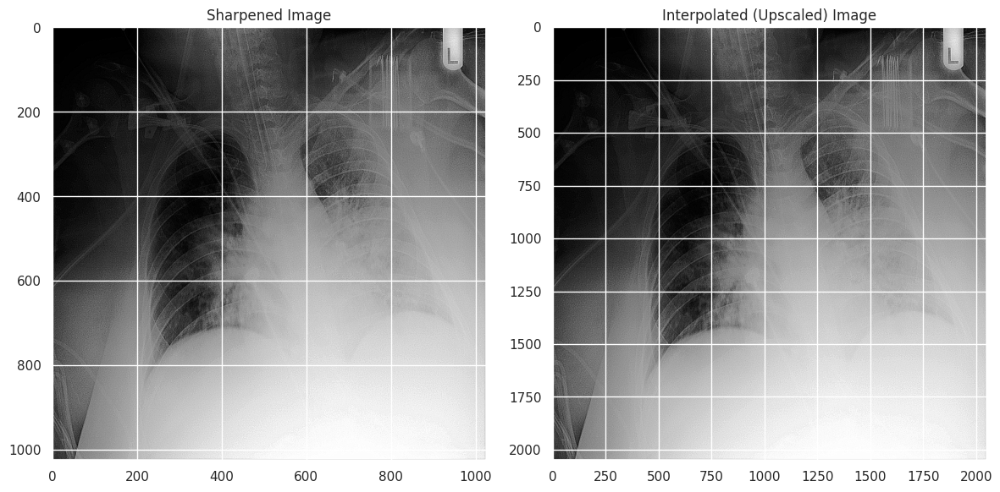

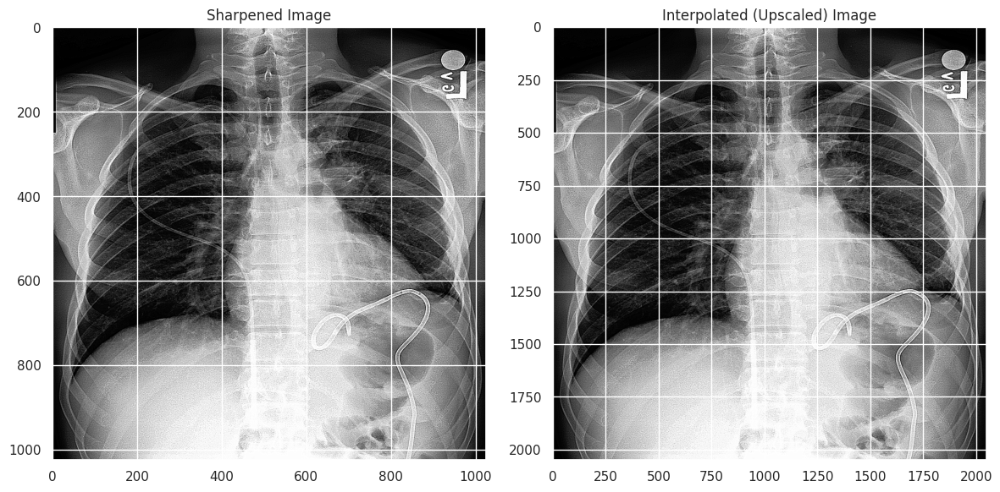

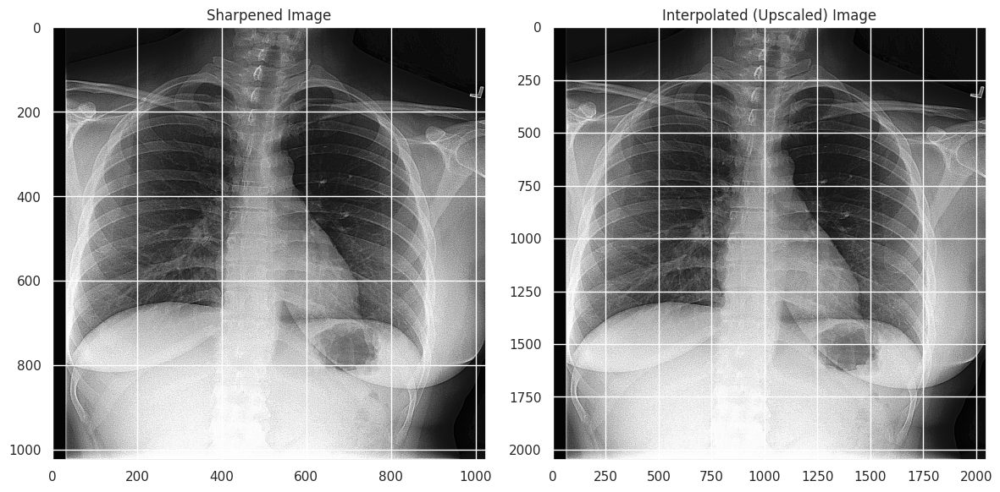

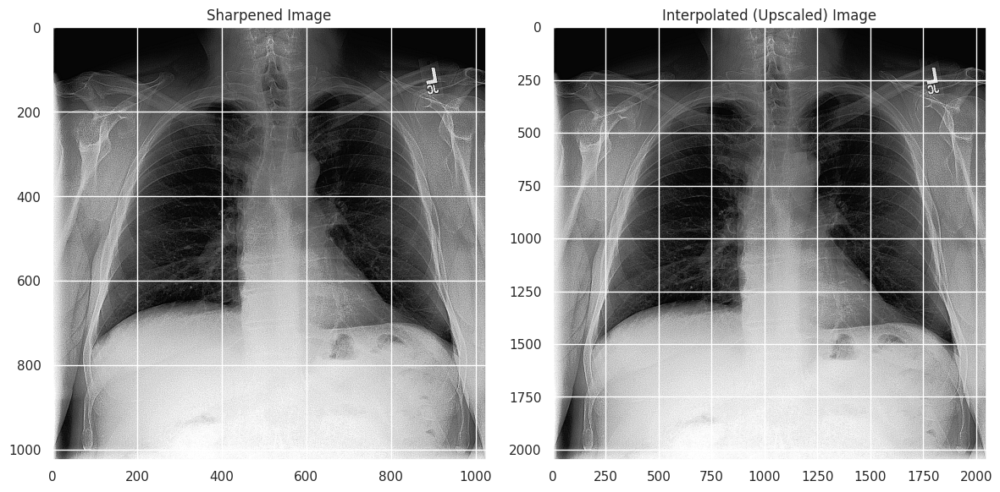

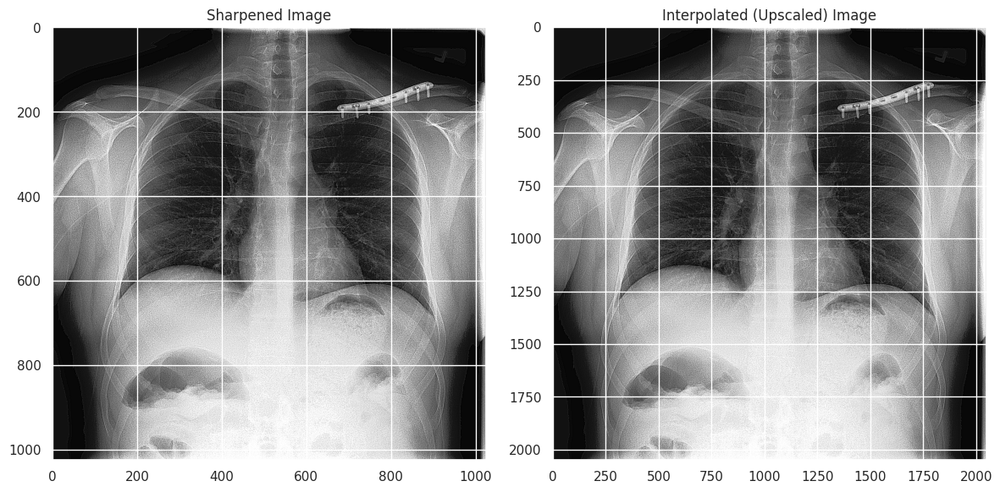

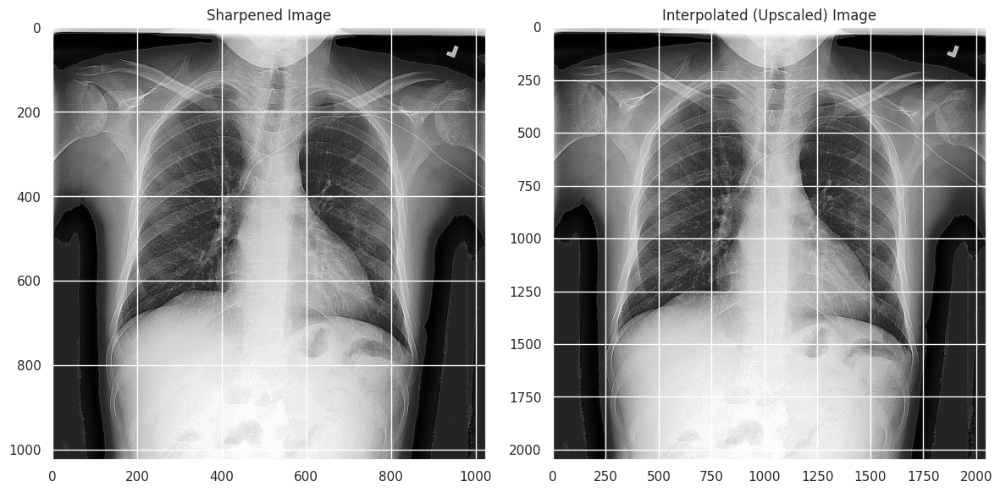

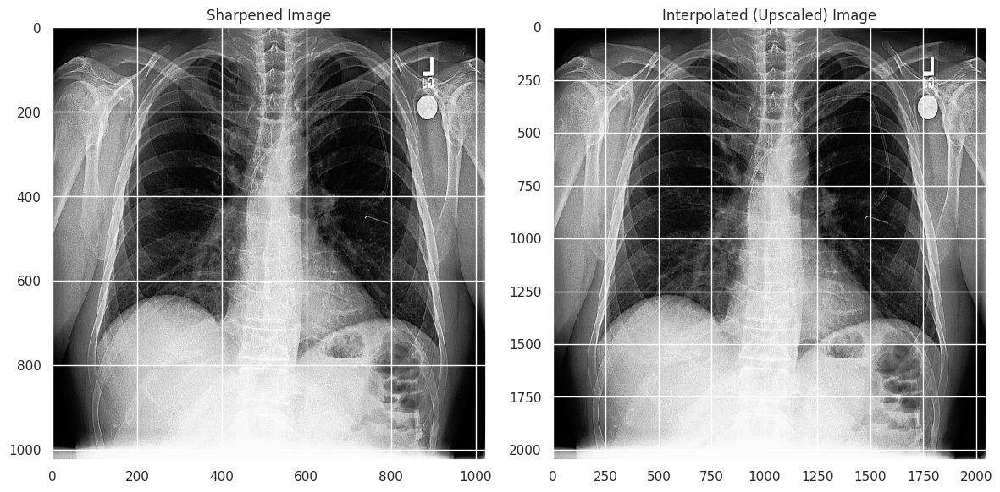

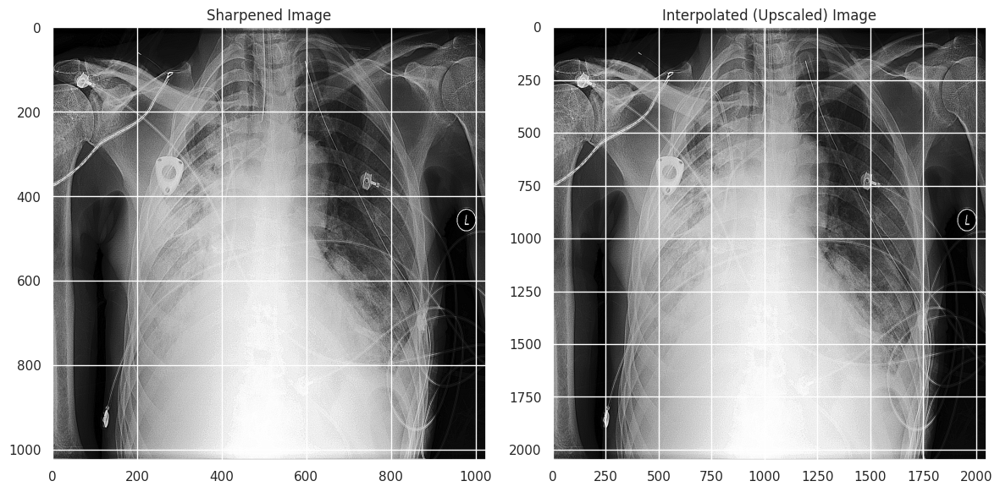

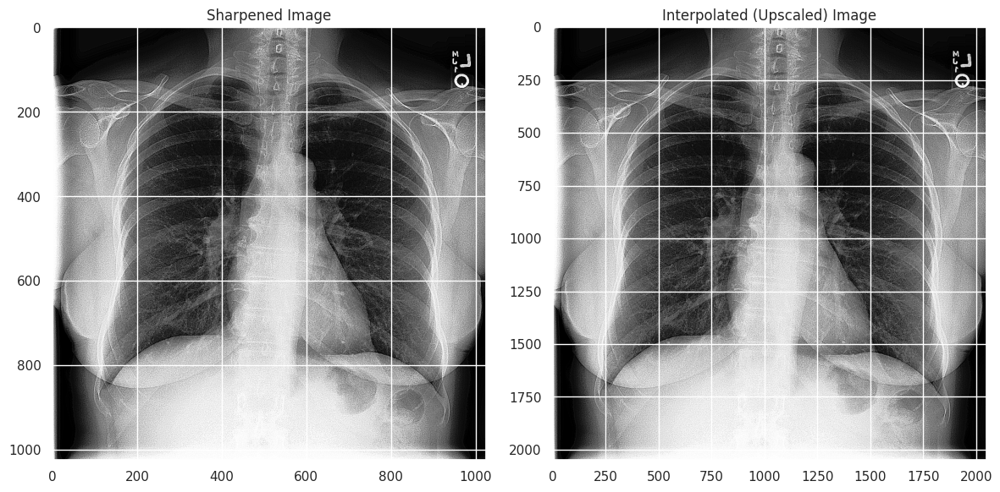

In [ ]:
# Step 7: sharpining
for i in range(9):
  apply_sharpening(i)

Teslim Edilecekler
    • Her adımda kodları ve çıktıları açıklayan bir Jupyter Notebook dosyası.
    • COLAB linki
    • Word dosyası
    • Görüntü işleme adımlarında görüntülerin işlem öncesi ve sonrası halleri.
    • Her adımın sonunda elde edilen sonuçlarla ilgili kısa yorumlar.
Bu ödevle göğüs röntgeni görüntülerinin işlenmesi ve analizine dair kapsamlı bilgi kazanacaksınız. Başarılar!